In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
sns.set()
%matplotlib inline

In [2]:
df=pd.read_csv("Downloads/archive/Crimes_With_Dates_Cleaned.csv",low_memory=False)

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 306094 entries, 0 to 306093
Data columns (total 36 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Unnamed: 0              306094 non-null  int64  
 1   Incident ID             306094 non-null  int64  
 2   Offence Code            306094 non-null  object 
 3   CR Number               306094 non-null  int64  
 4   Dispatch Date / Time    257065 non-null  object 
 5   NIBRS Code              306094 non-null  object 
 6   Victims                 306094 non-null  int64  
 7   Crime Name1             305822 non-null  object 
 8   Crime Name2             305822 non-null  object 
 9   Crime Name3             305822 non-null  object 
 10  Police District Name    306000 non-null  object 
 11  Block Address           279888 non-null  object 
 12  City                    304818 non-null  object 
 13  State                   306094 non-null  object 
 14  Zip Code            

In [4]:
# reset date index, as original dispach date/time has a lot missing values
df.index = pd.to_datetime(10000 * df.Year + 100 * df.Month + df.Day,
                          format='%Y%m%d')
# crime count, each row is a crime record
# reset Unnamed:0 as crime_count
crime_count = df['Unnamed: 0'].value_counts()
df['Unnamed: 0'] = crime_count.values
df.rename(columns={'Unnamed: 0':'crime_count'}, inplace=True)
# sort index, by ascending order of datetime
df.sort_index(inplace=True)
df.head()

,crime_count,Incident ID,Offence Code,CR Number,Dispatch Date / Time,NIBRS Code,Victims,Crime Name1,Crime Name2,Crime Name3,...,End_Date_Time,Latitude,Longitude,Police District Number,Location,Year,Month,Year-Month,Day,Committed_At_Morning
2016-07-01,1,201087200,2205,16033352,NaN,220,1,Crime Against Property,Burglary/Breaking and Entering,BURGLARY - NO FORCED ENTRY-NONRESIDENTIAL,...,NaN,38.998593,-77.117826,2D,"(38.9986, -77.1178)",2016,7,2016-07,1,False
2016-07-01,1,201087254,2605,16033434,NaN,26B,1,Crime Against Property,Credit Card/Automatic Teller Machine Fraud,FRAUD - ILLEGAL USE CREDIT CARDS,...,07/01/2016 08:00:00 PM,39.092026,-77.147406,1D,"(39.092, -77.1474)",2016,7,2016-07,1,False
2016-07-01,1,201087231,4104,16033420,NaN,90G,1,Crime Against Society,Liquor Law Violations,LIQUOR - POSSESS,...,07/01/2016 10:21:00 PM,38.998869,-76.998236,3D,"(38.9989, -76.9982)",2016,7,2016-07,1,False
2016-07-01,1,201087150,2589,16033287,NaN,250,1,Crime Against Property,Counterfeiting/Forgery,FORGERY (DESCRIBE OFFENSE),...,07/01/2016 10:40:00 AM,39.148951,-77.207681,6D,"(39.149, -77.2077)",2016,7,2016-07,1,True
2016-07-01,1,201087937,5404,16033240,NaN,90D,1,Crime Against Society,Driving Under the Influence,DRIVING UNDER THE INFLUENCE LIQUOR,...,NaN,39.006547,-77.111792,2D,"(39.0065, -77.1118)",2016,7,2016-07,1,True


# 1. Total number of Crime committed and Victims between 2016 and 2022 in Montgomery County

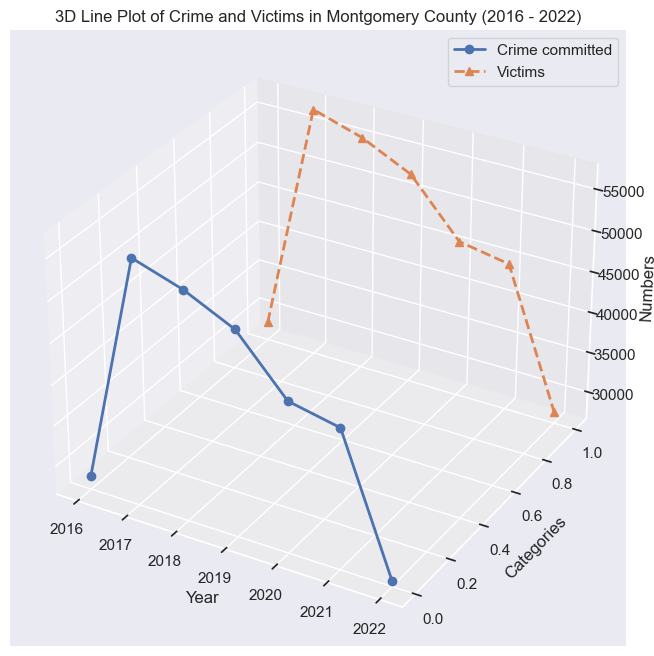

In [5]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


# Querying to obtain the total crime and victims count
yearly = df.groupby(df.index.year)[['crime_count', 'Victims']].sum()
# Create a 3D figure
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Extracting data
years = yearly.index
crime_count = yearly['crime_count']
victims = yearly['Victims']

# Plotting 3D line for Crime committed
ax.plot(years, crime_count, zs=0, zdir='y', label='Crime committed', linewidth=2, marker='o')

# Plotting 3D line for Victims
ax.plot(years, victims, zs=1, zdir='y', label='Victims', linewidth=2, linestyle='--', marker='^')

# Set labels and title
ax.set_xlabel('Year')
ax.set_ylabel('Categories')
ax.set_zlabel('Numbers')
ax.set_title('3D Line Plot of Crime and Victims in Montgomery County (2016 - 2022)')

# Add legend
ax.legend()

# Show the plot
plt.show()


In [6]:
# Calculate percentage change for both crime_count and Victims
yearly['crime_change'] = yearly['crime_count'].pct_change() * 100
yearly['victims_change'] = yearly['Victims'].pct_change() * 100

# Calculate the total percentage change for both crime_count and Victims
yearly['total_change'] = yearly[['crime_count', 'Victims']].pct_change().sum(axis=1) * 100

# Display the analysis table
analysis_table = yearly[['crime_count', 'Victims', 'crime_change', 'victims_change', 'total_change']]
analysis_table = analysis_table.rename(columns={'crime_count': 'Total Crimes ', 'Victims': 'Total Victims'})
print(analysis_table)


      Total Crimes   Total Victims  crime_change  victims_change  total_change
2016          28241          28843           NaN             NaN      0.000000
2017          56288          57369     99.313055       98.900947    198.214002
2018          54334          55489     -3.471433       -3.277031     -6.748464
2019          51456          52574     -5.296868       -5.253293    -10.550161
2020          44912          45945    -12.717662      -12.608894    -25.326556
2021          43647          44841     -2.816619       -2.402873     -5.219492
2022          27216          27979    -37.645199      -37.603979    -75.249177


### Total Crimes and Total Victims:
- In 2016, there were 28,241 total crimes reported, with 28,843 total victims.
- The number of total crimes increased in 2017 to 56,288, and the total victims increased to 57,369.

### Percentage Change:
- The percentage change in total crimes and total victims is calculated relative to the previous year.
- In 2017, there is a substantial increase in both total crimes (99.31%) and total victims (98.90%) compared to 2016.
- In 2018, there is a decrease in both total crimes (-3.47%) and total victims (-3.28%) compared to 2017.
- The trend continues with further decreases in 2019 and 2020.

### Total Percentage Change:
- The total percentage change considers the combined effect of changes in both total crimes and total victims.
- In 2017, the total percentage change is a significant increase of 198.21%, reflecting the overall rise in both crimes and victims.
- Subsequently, there are decreases in the total percentage change in 2018, 2019, and 2020, indicating a general decrease in both crimes and victims.
- In 2022, there is a substantial decrease in the total percentage change (-75.25%), indicating a significant reduction in both total crimes and total victims compared to 2021.

### Overall Trend:
- The data suggests a peak in both total crimes and total victims in 2017, followed by a declining trend in the subsequent years.
- The year 2022 stands out with a notable decrease in both total crimes and total victims compared to the previous years.

### Considerations:
- Further investigation into the causes of the trends observed in 2022 may be necessary.
- External factors, changes in law enforcement, or community initiatives could contribute to the observed patterns.
- This analysis provides a high-level overview of the trends in total crimes and victims over the years. For a more comprehensive understanding, additional context and information about the region or specific events may be needed.

## 1.1 Time Series of crime committed in Montgomery County between 2016 and 2022

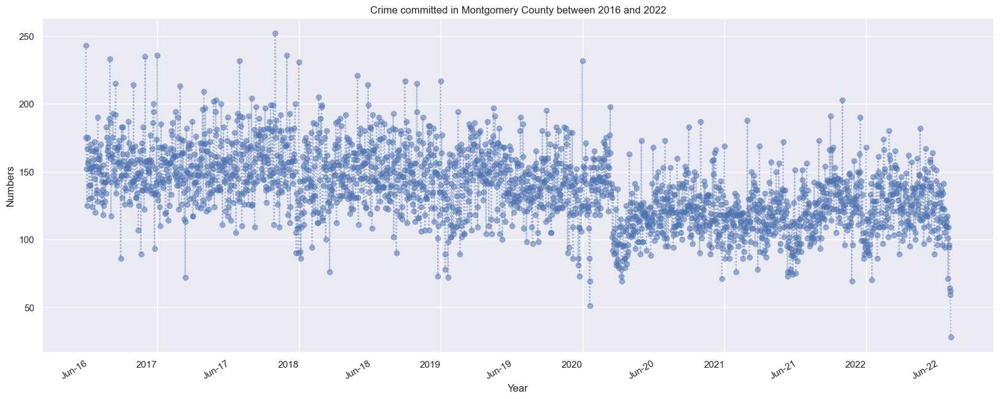

In [7]:
# time series crime committed in Montgomery County between 2016 and 2022

fig = plt.figure()
ax = df.groupby(df.index)['crime_count'].sum().plot(
    alpha=0.5,
    style=':o',
    figsize=(20, 8),
    xlabel='Year',
    ylabel='Numbers',
    title='Crime committed in Montgomery County between 2016 and 2022',
    x_compat=True,
    rot=0,
)
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
ax.xaxis.set_minor_formatter(mdates.DateFormatter('%b-%y'))
ax.xaxis.set_minor_locator(mdates.MonthLocator(bymonth=6))

for label in ax.get_xticklabels(which='minor'):
    label.set(rotation=30)

- The chart above shows the crime per day over a six-year period. It is not easy to see trends.



### The next graph will show the distribution of crime per year.

## 1.2 Annual distribution of crime

<Figure size 640x480 with 0 Axes>

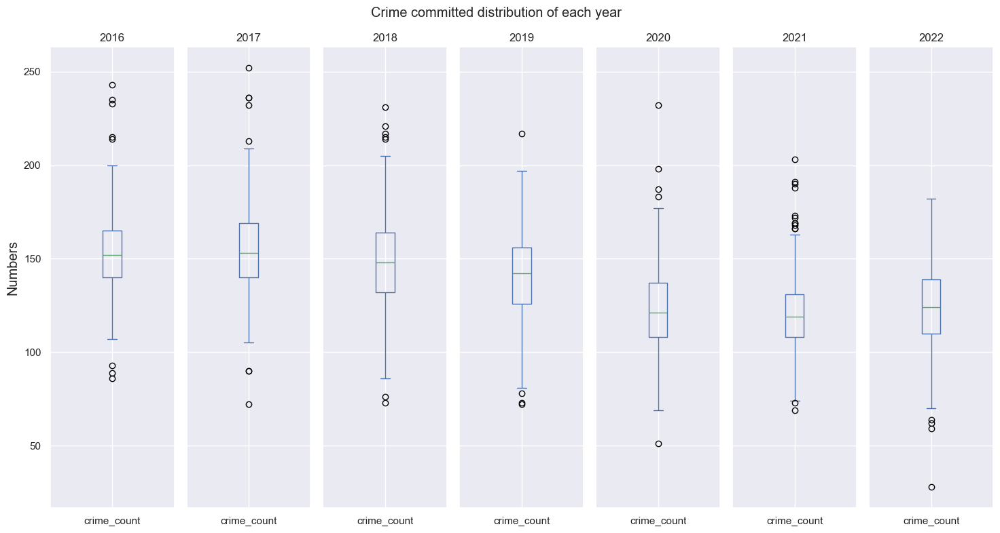

In [8]:
# Crime committed distribution of each year

fig = plt.figure()
fig, ax = plt.subplots(1, 7, figsize = (15,8), sharey = True)

count = 0
for y in [2016, 2017, 2018, 2019, 2020, 2021, 2022]:
    by_year = df[(df.index.year == y)]['crime_count']      # in particular year
    by_day = by_year.groupby(by_year.index).sum()          # count for each day in the year
    by_day.plot(kind='box', ax=ax[count], title=y)
    count += 1

fig.suptitle('Crime committed distribution of each year')
fig.supylabel('Numbers')
fig.subplots_adjust(left=0.08)
fig.tight_layout()




In [9]:
# Create a dictionary to store summary statistics for each year
summary_stats = {'Year': [], 'Mean': [], 'Median': [], 'Q1': [], 'Q3': [], 'Min': [], 'Max': []}

# Loop through each year
for y in [2016, 2017, 2018, 2019, 2020, 2021, 2022]:
    by_year = df[(df.index.year == y)]['crime_count']  # in a particular year
    by_day = by_year.groupby(by_year.index).sum()  # count for each day in the year
    
    # Calculate summary statistics
    year_summary = by_day.describe()
    
    # Append values to the dictionary
    summary_stats['Year'].append(y)
    summary_stats['Mean'].append(year_summary['mean'])
    summary_stats['Median'].append(year_summary['50%'])
    summary_stats['Q1'].append(year_summary['25%'])
    summary_stats['Q3'].append(year_summary['75%'])
    summary_stats['Min'].append(year_summary['min'])
    summary_stats['Max'].append(year_summary['max'])

# Create a DataFrame from the dictionary
summary_table = pd.DataFrame(summary_stats)

# Display the analysis table
print(summary_table)


   Year        Mean  Median     Q1     Q3   Min    Max
0  2016  153.483696   152.0  140.0  165.0  86.0  243.0
1  2017  154.213699   153.0  140.0  169.0  72.0  252.0
2  2018  148.860274   148.0  132.0  164.0  73.0  231.0
3  2019  140.975342   142.0  126.0  156.0  72.0  217.0
4  2020  122.710383   121.0  108.0  137.0  51.0  232.0
5  2021  119.580822   119.0  108.0  131.0  69.0  203.0
6  2022  124.273973   124.0  110.0  139.0  28.0  182.0


- The above distribution is essentially comparable to the time series plot, but it can be seen more clearly that the crime distribution is quite similar across years, with a symmetrical shape and similar IRQs, except for the lower median values in 2020, 2021 and 2022.

### 1.3 Total Crime and Victims counts for each day of the week

In [10]:
# using groupby dayofweek to get the sum of each attribute
df.groupby(df.index.dayofweek)[['crime_count', 'Victims']].sum()

,crime_count,Victims
0,42899,43880
1,44971,45869
2,45730,46636
3,45173,46057
4,47959,48960
5,41283,42344
6,38079,39294


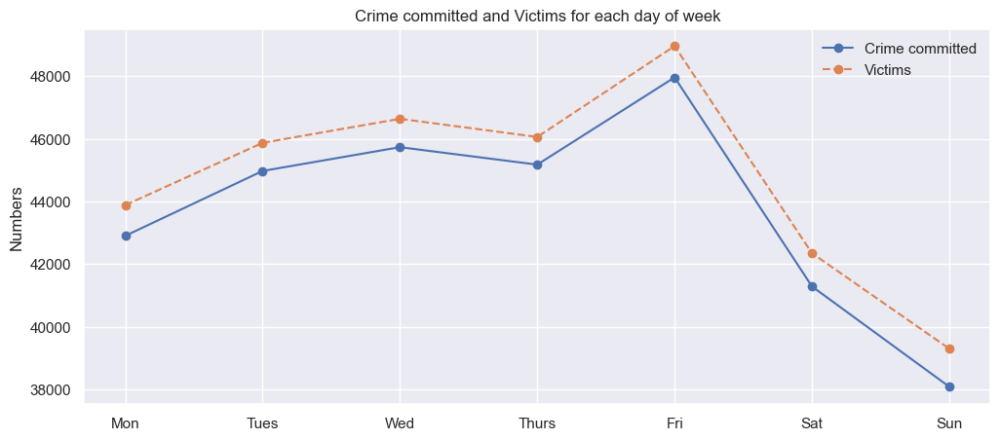

In [11]:
# sum of crime and victims for each dayofweek
by_weekday = df.groupby(df.index.dayofweek)[['crime_count', 'Victims']].sum()
# set the index of each day of week
by_weekday.index = ['Mon', 'Tues', 'Wed', 'Thurs', 'Fri', 'Sat', 'Sun']
by_weekday.plot(style=['-o', '--o'], figsize=(12, 5))
plt.title('Crime committed and Victims for each day of week')
plt.ylabel('Numbers')
plt.legend(['Crime committed', 'Victims'], frameon=False)

- An interesting observation from the above graph is that there is a significant decrease in the number of crimes on weekends compared to weekdays. Further research on this behavior is needed.

### 1.4 Total number of crimes and victims at different times of the day

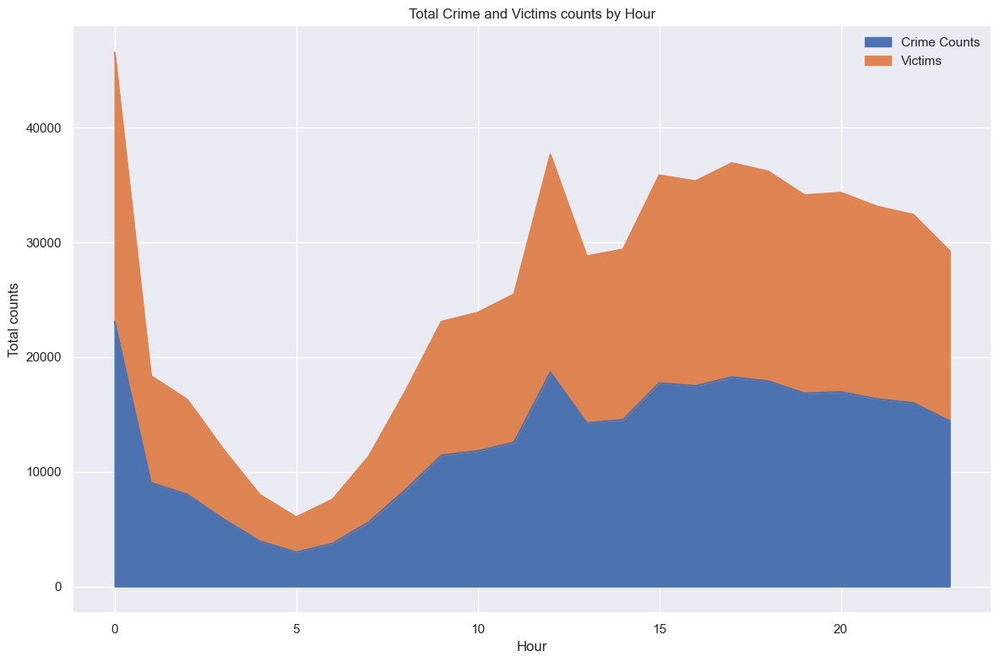

In [12]:
# using query to get the crime_count and victims total for each hour
# here, we extract the hour from start_date_time column,
# as it contains the hour info needed and without missing values

df['Hour'] = df['Start_Date_Time'].apply(pd.to_datetime, dayfirst=True).dt.hour

by_time = df.groupby(df['Hour'])[['crime_count', 'Victims']].sum()

by_time.plot(kind='area',
             title='Total Crime and Victims counts by Hour',
             ylabel='Total counts',
             xlabel='Hour',
             figsize=(12, 8))

ax = plt.gca()
l = ax.legend(frameon=False)
l.get_texts()[0].set_text('Crime Counts')
plt.tight_layout()

- As the graph above shows, the crime rate is lowest at 5:00 a.m. And the crime rate is highest at midnight.

# 2. Classification and analysis of criminal behavior

## 2.1 Crime type composition based on crime name1 from 2016 to 2022

In [13]:
import plotly.express as px
import pandas as pd

# Assuming df is your DataFrame containing the crime data

# Count for each sub-categories in crime name1
crime_counts = df['Crime Name1'].value_counts()

# Create a DataFrame with the counts
crime_df = pd.DataFrame({'Crime Name1': crime_counts.index, 'Count': crime_counts.values})

# Create an interactive pie chart using Plotly
fig = px.pie(crime_df, names='Crime Name1', values='Count',
             title='Crime type composition from 2016 to 2022',
             hover_data=['Count'],
             labels={'Count': 'Crime Count'},
             template='plotly_dark',  # You can change the template to your preferred style
             hole=0.4,  # Set the size of the hole in the middle of the pie
             )

# Customize the layout
fig.update_layout(
    font=dict(size=15),
    legend=dict(title='Crime Type'),
)

# Show the interactive plot
fig.show()


- Crimes against property accounted for the largest proportion of crimes, almost half of all crimes.

## 2.1 Crime type composition based on crime name1 for each year between 2016 and 2022

- Grouped by year, select 'Crime Name1' and calculate the number of each subcategory and convert it to a wide format for plotting.

- The raw data and graphs are displayed below.

In [14]:
# sort type of crime name1 in each year
crime1_yealy = df.groupby(
    'Year')['Crime Name1'].value_counts().unstack()
crime1_yealy

Crime Name1,Crime Against Person,Crime Against Property,Crime Against Society,Not a Crime,Other
Year,,,,,
2016,2498,12435,7812,340,5156
2017,4964,24267,15860,683,10501
2018,5130,21650,15839,625,11081
2019,4946,22026,13048,639,10762
2020,4423,22945,7127,514,9805
2021,5069,23086,5446,395,9567
2022,3240,13473,3785,379,6306


In [15]:
import plotly.graph_objs as go
import plotly.express as px
import pandas as pd

# Assuming df is your DataFrame containing the crime data

# Count for each sub-categories in crime name1 for each year
crime1_yearly = df.groupby(['Year', 'Crime Name1']).size().reset_index(name='Crime Count')

# Create the initial bar chart
fig = px.bar(crime1_yearly, x='Year', y='Crime Count', color='Crime Name1',
             labels={'Crime Count': 'Crime Count'},
             title='Composition of Crime Name1 for each year',
             )

# Customize the layout
fig.update_layout(
    xaxis=dict(type='category', title='Year'),
    yaxis=dict(title='Crime Count'),
    barmode='stack',
)

# Show the interactive plot
fig.show()


- The chart above shows that crimes against property account for the largest percentage of crimes each year.

- The number of crimes in 2016 and 2022 is relatively low because data was only collected for half a year in both years.

## 2.2 Further investigation on crime against property

- Here, focusing only on crimes against property, the dataset was filtered out and 'Crime Name2' was selected for a more in-depth study.

- Calculate the mean value based on the categories of Crime Name2 and filter out the types of crimes that are greater than the mean value.

Text(0.5, 0, 'Numbers')

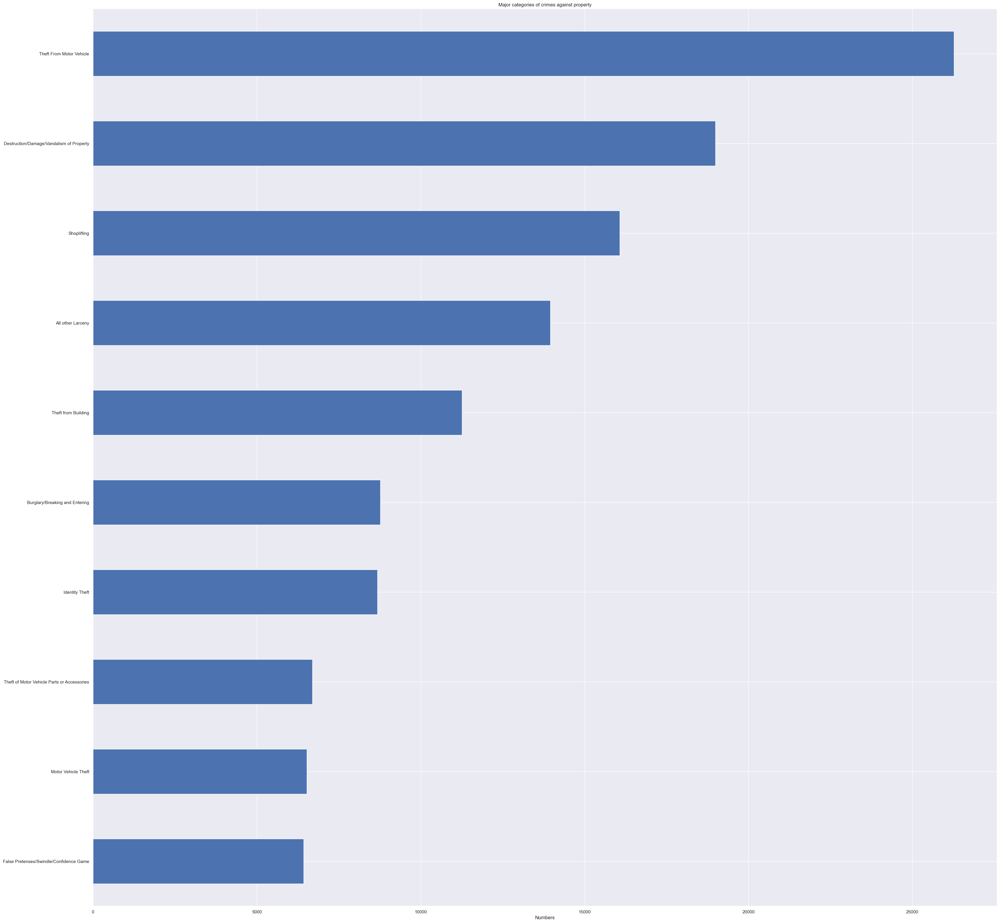

In [16]:
# further investigation on crime against property
property_crime = df[df['Crime Name1'] == 'Crime Against Property']
# calculate the mean value for crime name2, mean by column
total_count = property_crime['Crime Name2'].value_counts()
mean_val = property_crime['Crime Name2'].value_counts().mean()
# conditional filter out
cp_top = total_count[total_count > mean_val]
# plot
cp_top.sort_values().plot.barh(
    title='Major categories of crimes against property', 
figsize=(40, 40))
plt.xlabel('Numbers')

- The figure above shows the main categories of crimes against property, as their names are quite long and not easy to visualize.

- The word cloud module will be used to visualize the names of these crimes.

## 2.3 Visualization by wordcloud on major categories of crime against property

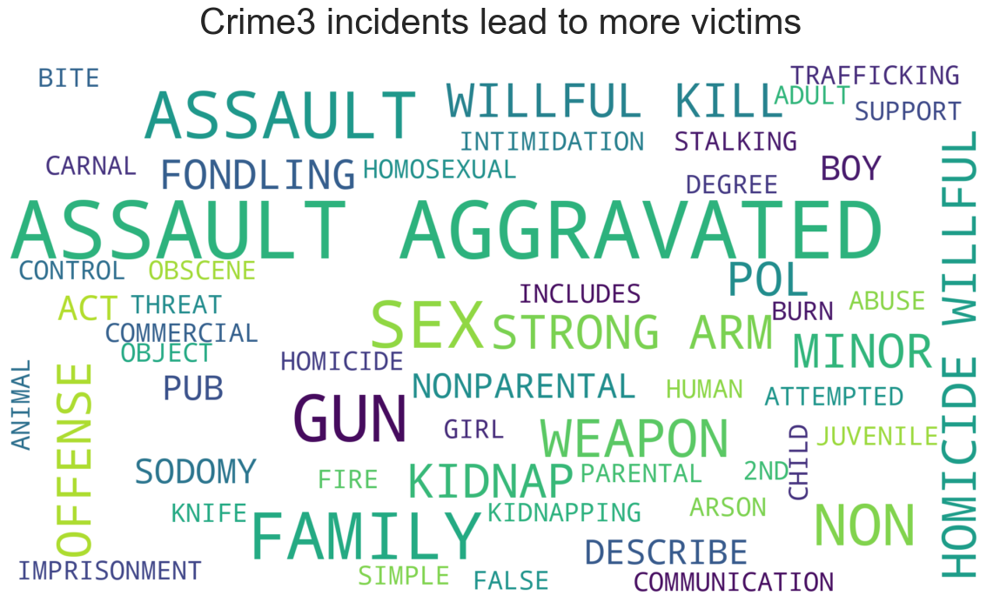

In [17]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import mplcursors


# find mean of crime name3
df_name3 = df.groupby('Crime Name3')['Victims'].mean().sort_values(
    ascending=False)
# column mean
name3_col_mean = df_name3.values.mean()
# filter crime name greater than column mean
text_name3 = df_name3[df_name3.values > name3_col_mean].index

# wordcloud plotting
text = " ".join(text_name3)
wc2 = WordCloud(width=1980,
                height=1080,
                background_color="white",
                random_state=13).generate(text)

plt.figure(figsize=(20, 8))
plt.imshow(wc2, interpolation="bilinear")
plt.axis("off")
plt.title("Crime3 incidents lead to more victims", fontdict={"fontsize": 30}, pad=25)

# Add interactive tooltips
cursor = mplcursors.cursor(hover=True)
cursor.connect("add", lambda sel: sel.annotation.set_text(sel.artist.get_text()))

plt.show()


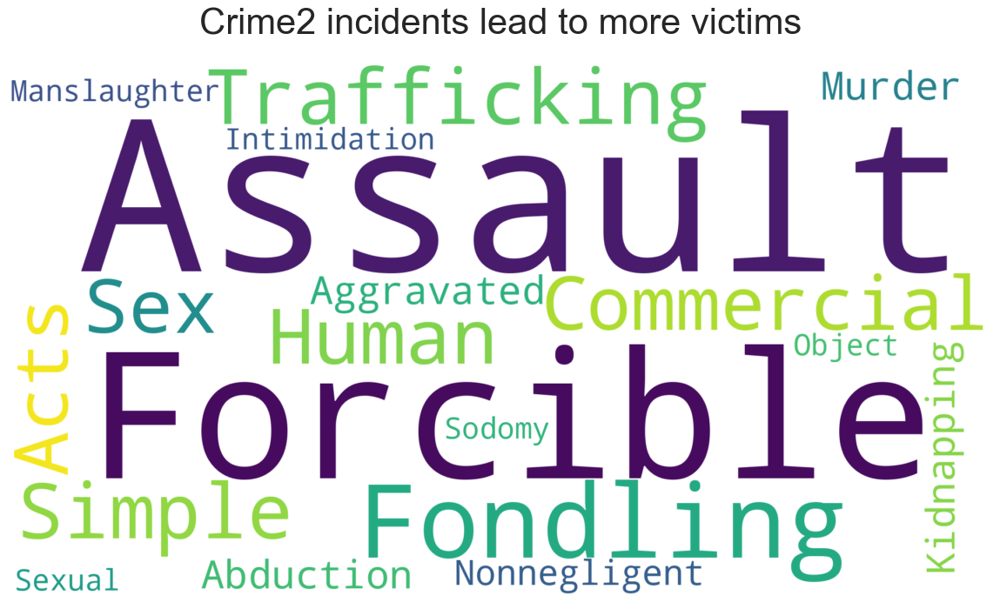

In [18]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import mplcursors


# find mean of crime name3
df_name3 = df.groupby('Crime Name2')['Victims'].mean().sort_values(
    ascending=False)
# column mean
name3_col_mean = df_name3.values.mean()
# filter crime name greater than column mean
text_name3 = df_name3[df_name3.values > name3_col_mean].index

# wordcloud plotting
text = " ".join(text_name3)
wc2 = WordCloud(width=1980,
                height=1080,
                background_color="white",
                random_state=13).generate(text)

plt.figure(figsize=(20, 8))
plt.imshow(wc2, interpolation="bilinear")
plt.axis("off")
plt.title("Crime2 incidents lead to more victims", fontdict={"fontsize": 30}, pad=25)

# Add interactive tooltips
cursor = mplcursors.cursor(hover=True)
cursor.connect("add", lambda sel: sel.annotation.set_text(sel.artist.get_text()))

plt.show()


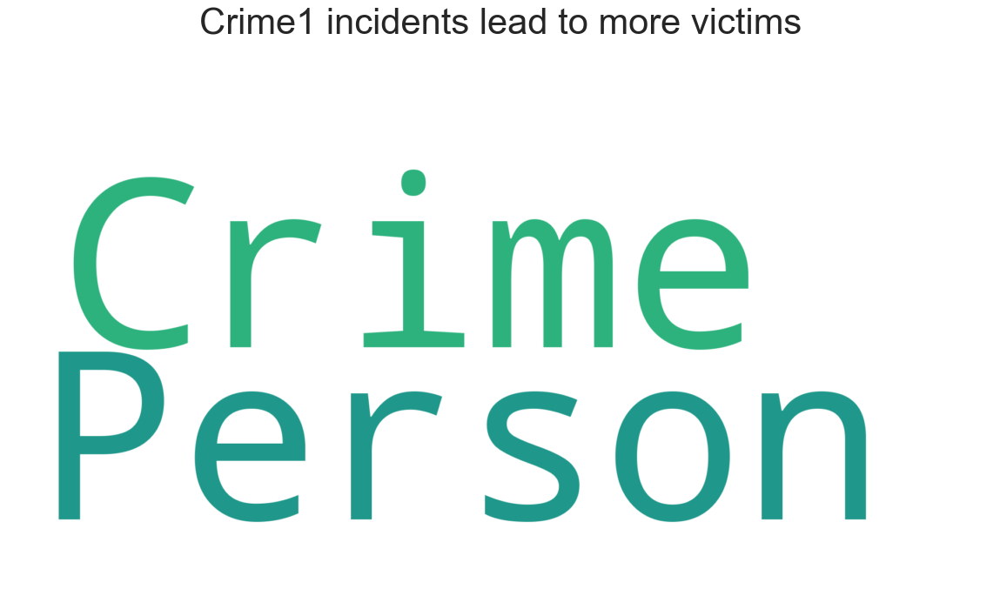

In [19]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import mplcursors


# find mean of crime name3
df_name3 = df.groupby('Crime Name1')['Victims'].mean().sort_values(
    ascending=False)
# column mean
name3_col_mean = df_name3.values.mean()
# filter crime name greater than column mean
text_name3 = df_name3[df_name3.values > name3_col_mean].index

# wordcloud plotting
text = " ".join(text_name3)
wc2 = WordCloud(width=1980,
                height=1080,
                background_color="white",
                random_state=13).generate(text)

plt.figure(figsize=(20, 8))
plt.imshow(wc2, interpolation="bilinear")
plt.axis("off")
plt.title("Crime1 incidents lead to more victims", fontdict={"fontsize": 30}, pad=25)

# Add interactive tooltips
cursor = mplcursors.cursor(hover=True)
cursor.connect("add", lambda sel: sel.annotation.set_text(sel.artist.get_text()))

plt.show()


## 2.4 Correlation of crime incidents with the number of victims

Analyze which crime incidents lead to more victims

In [20]:
# calculate mean of Victims for different crime categories
df.groupby(['Crime Name1', 'Crime Name2','Crime Name3'])['Victims'].mean().sort_values(ascending=False)

Crime Name1             Crime Name2           Crime Name3                          
Other                   All Other Offenses    NON SUPPORT                              4.000000
Crime Against Person    Aggravated Assault    ASSAULT - AGGRAVATED - PUB OFF-GUN       1.750000
                                              ASSAULT - AGGRAVATED - NON-FAMILY-GUN    1.423256
                                              ASSAULT - AGGRAVATED - GUN               1.397233
                        Kidnapping/Abduction  KIDNAPPING (DESCRIBE OFFENSE)            1.384615
                                                                                         ...   
Crime Against Property  Robbery               ROBBERY - BUSINESS-STRONG-ARM            1.000000
                                              ROBBERY - BUSINESS-OTHER WEAPON          1.000000
                                              ROBBERY - BUSINESS-GUN                   1.000000
                                              ROBBER

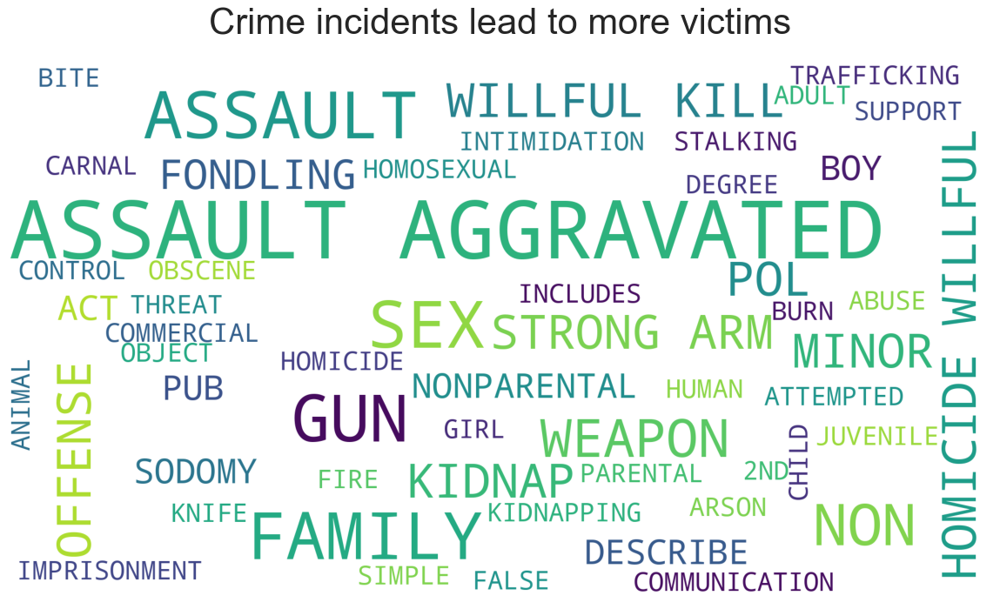

In [21]:
# find mean of crime name3
# mean of each crime type, mean by row
df_name3 = df.groupby('Crime Name3')['Victims'].mean().sort_values(
    ascending=False)
# column mean
name3_col_mean = df_name3.values.mean()
# filter crime name greater than column mean
text_name3 = df_name3[df_name3.values > name3_col_mean].index

#wordcloud plotting
text = " ".join(text_name3)
wc2 = WordCloud(width=1980,
                height=1080,
                background_color="white",
                random_state=13).generate(text)

plt.figure(figsize=(20, 8))
plt.imshow(wc2)
plt.axis("off")
plt.title("Crime incidents lead to more victims", fontdict={"fontsize": 30}, pad=25)
plt.show()

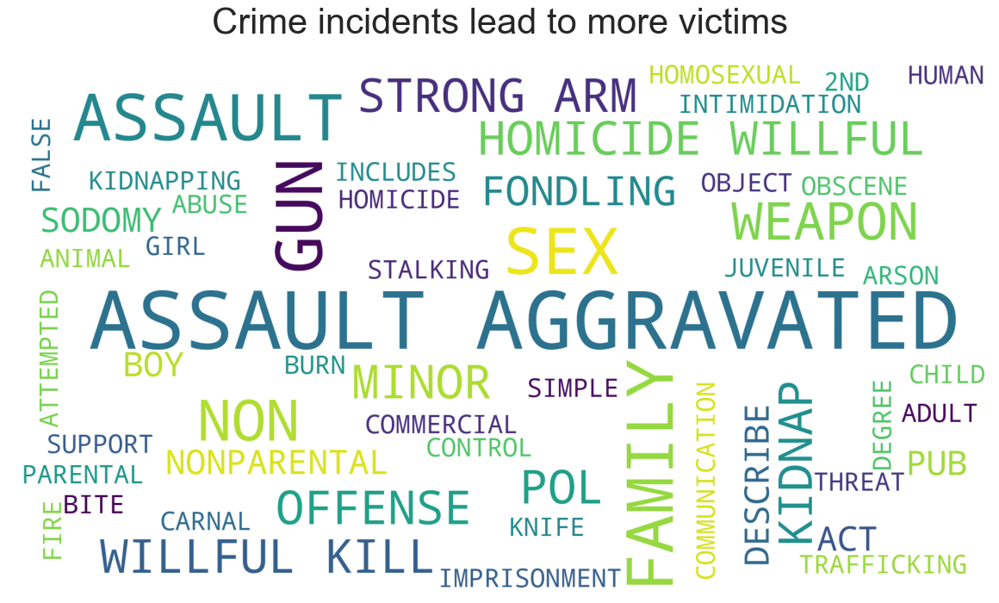

In [22]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import mplcursors  # Make sure to install mplcursors

# Your existing code to generate the word cloud
df_name3 = df.groupby('Crime Name3')['Victims'].mean().sort_values(ascending=False)
name3_col_mean = df_name3.values.mean()
text_name3 = df_name3[df_name3.values > name3_col_mean].index
text = " ".join(text_name3)
wc2 = WordCloud(width=2000, height=1080, background_color="white", random_state=30).generate(text)

# Plotting the word cloud
plt.figure(figsize=(20, 8))
plt.imshow(wc2)
plt.axis("off")
plt.title("Crime incidents lead to more victims", fontdict={"fontsize": 30}, pad=25)

# Adding annotations with mplcursors
cursor = mplcursors.cursor(hover=True)

@cursor.connect("add")
def on_add(sel):
    sel.annotation.set_text(sel.artist.get_text())

# Show the plot
plt.show()


- The chart above shows that crimes involving 'ASSAULT AGGRAVATED, ASSAULT, WEAPON AND GUN' result in more victims

# 3. Geographical Heat Map

## 3.1 Geographic heat map of crime between 2016 and 2022

- Since the dataset contains the latitude and longitude coordinates of each crime, it would be interesting to create a geographic heat map for visualization purposes.

- Here, the "Locations" are sorted in descending order based on the sum of the "crime_count", so that the top location will be the area where the most crimes occur.

- However, the first position shows (0, 0), which is most likely a data collection error. Therefore, the second position will be selected for processing analysis.

In [23]:
#geographical analysis
df_location = df.groupby('Location')['crime_count'].sum().sort_values(
    ascending=False)
df_location.index[1]

'(39.0374, -77.0517)'

Plot using folium module and plugins to creat geographical heat map.

Geographic data selects the two columns containing latitude and longitude coordinates in the dataset and sets the input location parameters to the location already filtered out above.

In [24]:
import folium
from folium import plugins

# build df_geo selectting coordinates without (0, 0)
df_geo = df.query('Latitude != 0.0 and Longitude != 0.0')[[
    'Latitude', 'Longitude'
]]
# plot
crime_map = folium.Map(location=[39.0374, -77.0517],
                       tiles='OpenStreetmap',
                       zoom_start=16.0,
                       min_zoom=2.0)
crime_map.add_child(
    plugins.HeatMap(df_geo, radius=25, min_opacity=0.7, blur=15))
crime_map

- The heat map shows that the center of the map is a shopping center, which is related to the analysis that most of the crime types are property-specific crimes and more specifically related to theft and motor vehicles

## 3.2 Heatmap for sepecific period¶

- An attempt was made to heat map the peak crime period, i.e. 23:00 to 1:00 am on weekdays.

In [25]:
import pandas as pd

# Assuming 'Start_Date_Time' is not in datetime format
df['Start_Date_Time'] = pd.to_datetime(df['Start_Date_Time'])

# Filter the conditional data
filter_lat = df.loc[(df.index.weekday < 5) &
                    ((df['Start_Date_Time'].dt.hour == 23) |
                     (df['Start_Date_Time'].dt.hour == 0))]['Latitude']
filter_lon = df.loc[(df.index.weekday < 5) &
                    ((df['Start_Date_Time'].dt.hour == 23) |
                     (df['Start_Date_Time'].dt.hour == 0))]['Longitude']

# Build a new geo dataframe without the (0.0, 0.0) values
df_geo1 = pd.DataFrame({
    'Latitude': filter_lat.values[filter_lat.values.nonzero()],
    'Longitude': filter_lon.values[filter_lon.values.nonzero()]
})

# Sort Hotspots
df_geo1.value_counts()


Latitude   Longitude 
39.111781  -77.235281    531
39.111728  -77.235295    136
39.113040  -77.236300    123
39.107938  -77.148079     95
           -77.148110     68
                        ... 
39.062471  -77.041940      1
39.062491  -77.075312      1
39.062558  -77.160680      1
39.062560  -77.186484      1
90.000000  -62.372081      1
Length: 12634, dtype: int64

In [26]:
import folium
from folium import plugins

# Use the results of the above analysis to create a heat map
crime_map1 = folium.Map(
    location=[39.111781, -77.235281],
    tiles='Stamen Terrain',
    zoom_start=15.0,
    min_zoom=2.0,
    attr='Stamen Terrain Attribution'  # Add attribution for Stamen Terrain
)

crime_map1.add_child(
    plugins.HeatMap(df_geo1, radius=25, min_opacity=0.7, blur=15)
)

crime_map1


The above grapgh was crashing in my laptop so i have added another one, in this we are saving the output as html file. 

In [27]:
import gmplot
import pandas as pd

#df_geo1 contains latitude and longitude columns
latitude = df_geo1['Latitude'].tolist()
longitude = df_geo1['Longitude'].tolist()

# Set the center of the map
gmap = gmplot.GoogleMapPlotter(39.111781, -77.235281, zoom=15)

# Plot heatmap
gmap.heatmap(latitude, longitude)

# Save the map to an HTML file
gmap.draw("heatmap.html")
